Stock Prediction
---

# Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.linear_model import LogisticRegression

# Loading Data

In [2]:
df=pd.read_csv('TATAMOTORS.csv')
df.head()

,Date,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble
0,2000-01-03,TELCO,EQ,201.60,207.4,217.25,207.4,217.0,216.75,214.28,676126,1.448775e+13,NaN,NaN,NaN
1,2000-01-04,TELCO,EQ,216.75,217.0,219.00,206.0,211.9,208.20,209.50,679215,1.422962e+13,NaN,NaN,NaN
2,2000-01-05,TELCO,EQ,208.20,194.0,217.80,194.0,213.1,213.25,210.33,1120951,2.357684e+13,NaN,NaN,NaN
3,2000-01-06,TELCO,EQ,213.25,215.0,229.90,215.0,222.0,222.10,225.29,1968998,4.435932e+13,NaN,NaN,NaN
4,2000-01-07,TELCO,EQ,222.10,224.0,239.90,223.1,239.9,239.90,236.32,2199431,5.197636e+13,NaN,NaN,NaN


In [3]:
df = df.drop(['Trades', 'Deliverable Volume', '%Deliverble'], axis = True)

In [4]:
df.isna().sum()

Date          0
Symbol        0
Series        0
Prev Close    0
Open          0
High          0
Low           0
Last          0
Close         0
VWAP          0
Volume        0
Turnover      0
dtype: int64

**This implies that there are no null values in the data set provided.**

In [5]:
df.describe()

,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover
count,5306.000000,5306.000000,5306.000000,5306.000000,5306.000000,5306.000000,5306.000000,5.306000e+03,5.306000e+03
mean,409.432878,410.152752,417.122512,402.179438,409.451828,409.450264,409.761357,1.046560e+07,2.790772e+14
std,272.483585,272.966475,277.018798,268.028297,272.516903,272.473264,272.491123,2.185034e+07,4.674351e+14
min,58.800000,58.000000,60.700000,57.550000,58.750000,58.800000,59.240000,1.235100e+04,1.069384e+11
25%,174.600000,174.762500,178.825000,171.012500,174.725000,174.600000,175.182500,1.668994e+06,7.049025e+13
50%,377.250000,378.900000,384.750000,372.600000,377.525000,377.250000,378.465000,4.141648e+06,1.967418e+14
75%,523.150000,523.475000,530.800000,515.912500,523.487500,523.150000,523.715000,8.706037e+06,3.175959e+14
max,1365.150000,1361.000000,1382.000000,1347.000000,1362.000000,1365.150000,1362.150000,3.905778e+08,9.365671e+15


In [6]:
df.shape

(5306, 12)

In [7]:
df.dtypes

Date           object
Symbol         object
Series         object
Prev Close    float64
Open          float64
High          float64
Low           float64
Last          float64
Close         float64
VWAP          float64
Volume          int64
Turnover      float64
dtype: object

# Visualizations

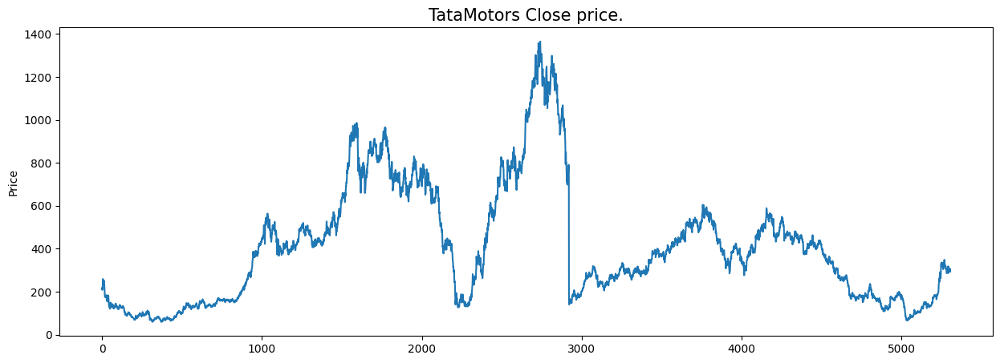

In [8]:
plt.figure(figsize=(15,5))
plt.plot(df['Close'])
plt.title('TataMotors Close price.', fontsize=15)
plt.ylabel('Price')
plt.show()

C:\Users\MIHIR\AppData\Local\Temp\ipykernel_1868\3613923270.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(),cmap='Blues',annot=True)


<Axes: >

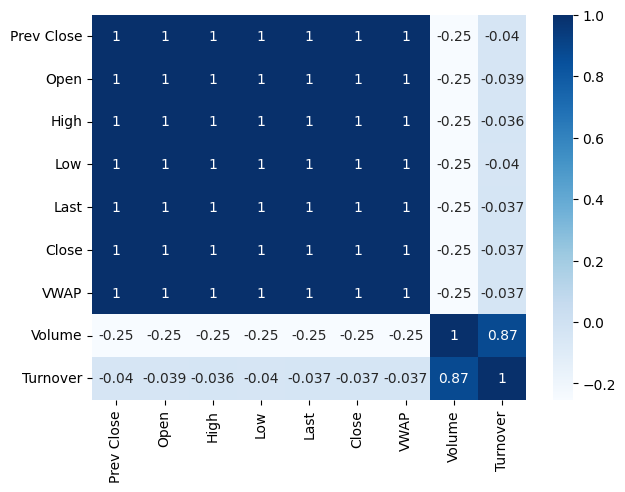

In [9]:
plt.figure(figsize=(7,5))
sns.heatmap(df.corr(),cmap='Blues',annot=True)

In [10]:
df['open-high'] = df['Open']-df['High']
df['open-low'] = df['Open'] - df['Low']
df['close-high'] = df['Close']-df['High']
df['close-low'] = df['Close'] - df['Low']
df['high-low'] = df['High'] - df['Low']
df['open-close'] = df['Open'] - df['Close']
df.head()

,Date,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,open-high,open-low,close-high,close-low,high-low,open-close
0,2000-01-03,TELCO,EQ,201.60,207.4,217.25,207.4,217.0,216.75,214.28,676126,1.448775e+13,-9.85,0.0,-0.50,9.35,9.85,-9.35
1,2000-01-04,TELCO,EQ,216.75,217.0,219.00,206.0,211.9,208.20,209.50,679215,1.422962e+13,-2.00,11.0,-10.80,2.20,13.00,8.80
2,2000-01-05,TELCO,EQ,208.20,194.0,217.80,194.0,213.1,213.25,210.33,1120951,2.357684e+13,-23.80,0.0,-4.55,19.25,23.80,-19.25
3,2000-01-06,TELCO,EQ,213.25,215.0,229.90,215.0,222.0,222.10,225.29,1968998,4.435932e+13,-14.90,0.0,-7.80,7.10,14.90,-7.10
4,2000-01-07,TELCO,EQ,222.10,224.0,239.90,223.1,239.9,239.90,236.32,2199431,5.197636e+13,-15.90,0.9,0.00,16.80,16.80,-15.90


C:\Users\MIHIR\AppData\Local\Temp\ipykernel_1868\4278360070.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data2.corr(),cmap='Blues',annot=True)


<Axes: >

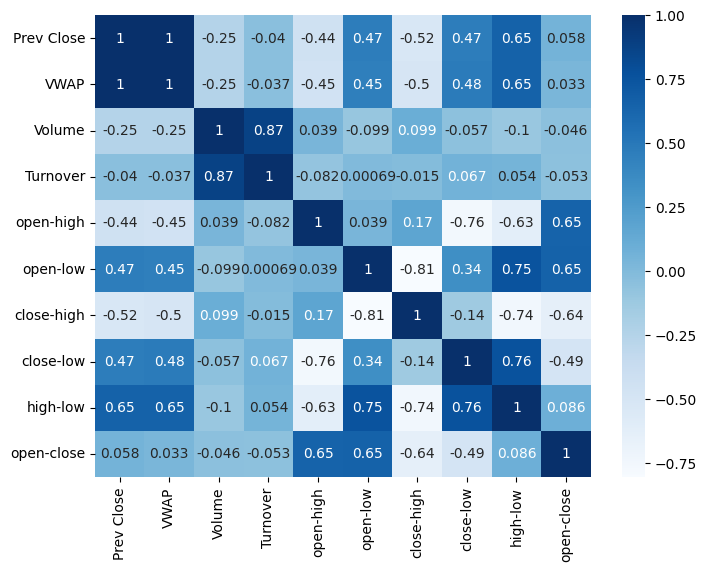

In [11]:
data2 = df.copy()
data2 = data2.drop(['Open','High','Low','Last', 'Close'],axis=1)
plt.figure(figsize=(8,6))
sns.heatmap(data2.corr(),cmap='Blues',annot=True)

In [12]:
from sklearn.preprocessing import LabelEncoder

# create a LabelEncoder object
le = LabelEncoder()

# fit and transform the column(s) to be encoded
df['Symbol'] = le.fit_transform(df['Symbol'])

In [13]:
# fit and transform the column(s) to be encoded
df['Series'] = le.fit_transform(df['Symbol'])

In [14]:
# Convert date column to datetime object
df['Date'] = pd.to_datetime(df['Date'])

# Extract year, month, and day into separate columns
df['year'] = df['Date'].dt.year
df['month'] = df['Date'].dt.month
df['day'] = df['Date'].dt.day

In [15]:
df.drop('Date', axis = 1, inplace = True)

In [16]:
df.head()

,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,open-high,open-low,close-high,close-low,high-low,open-close,year,month,day
0,1,1,201.60,207.4,217.25,207.4,217.0,216.75,214.28,676126,1.448775e+13,-9.85,0.0,-0.50,9.35,9.85,-9.35,2000,1,3
1,1,1,216.75,217.0,219.00,206.0,211.9,208.20,209.50,679215,1.422962e+13,-2.00,11.0,-10.80,2.20,13.00,8.80,2000,1,4
2,1,1,208.20,194.0,217.80,194.0,213.1,213.25,210.33,1120951,2.357684e+13,-23.80,0.0,-4.55,19.25,23.80,-19.25,2000,1,5
3,1,1,213.25,215.0,229.90,215.0,222.0,222.10,225.29,1968998,4.435932e+13,-14.90,0.0,-7.80,7.10,14.90,-7.10,2000,1,6
4,1,1,222.10,224.0,239.90,223.1,239.9,239.90,236.32,2199431,5.197636e+13,-15.90,0.9,0.00,16.80,16.80,-15.90,2000,1,7


In [17]:
df.columns

Index(['Symbol', 'Series', 'Prev Close', 'Open', 'High', 'Low', 'Last',
       'Close', 'VWAP', 'Volume', 'Turnover', 'open-high', 'open-low',
       'close-high', 'close-low', 'high-low', 'open-close', 'year', 'month',
       'day'],
      dtype='object')

In [18]:
columns = ['Prev Close', 'Open', 'High', 'Low', 'Last',
       'Close', 'VWAP', 'Volume', 'Turnover', 'open-high', 'open-low',
       'close-high', 'close-low', 'high-low', 'open-close', 'year', 'month',
       'day']

<Figure size 2500x600 with 0 Axes>

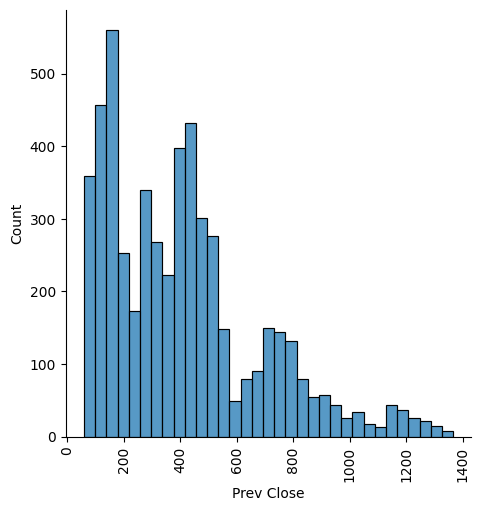

<Figure size 2500x600 with 0 Axes>

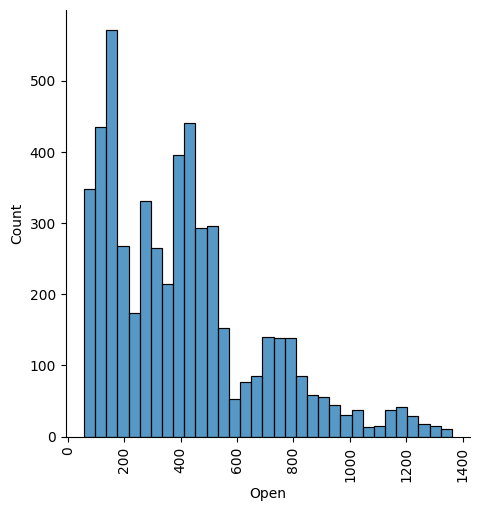

<Figure size 2500x600 with 0 Axes>

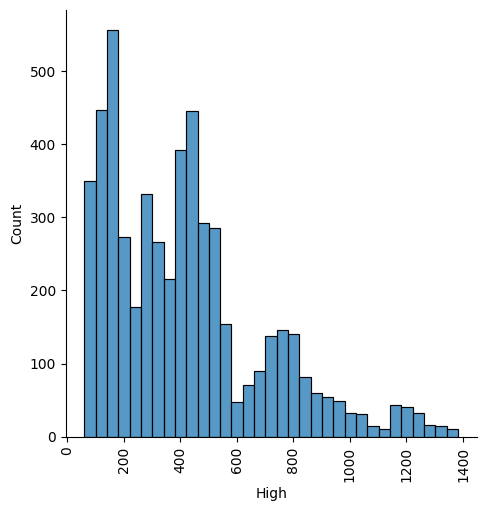

<Figure size 2500x600 with 0 Axes>

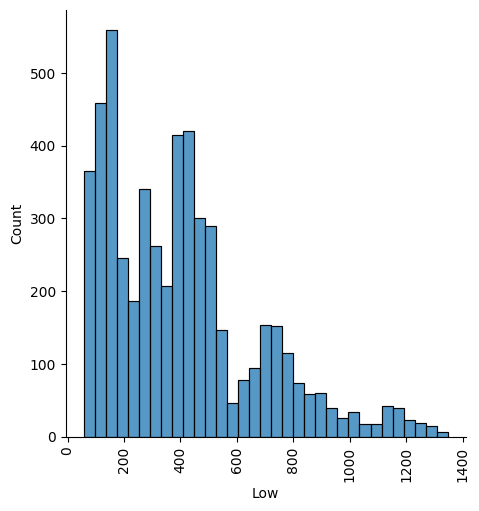

<Figure size 2500x600 with 0 Axes>

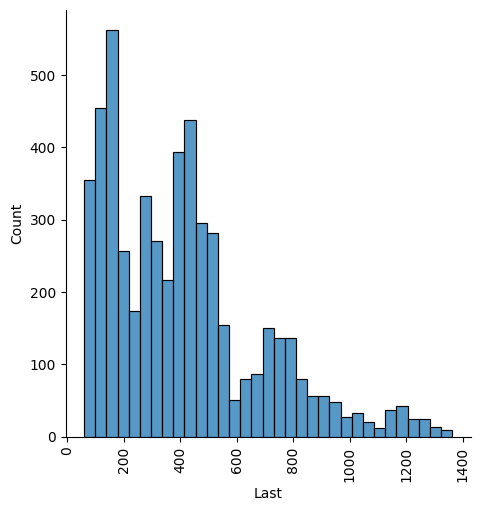

<Figure size 2500x600 with 0 Axes>

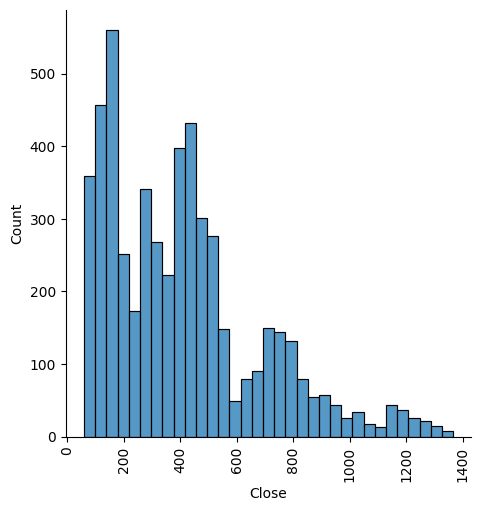

<Figure size 2500x600 with 0 Axes>

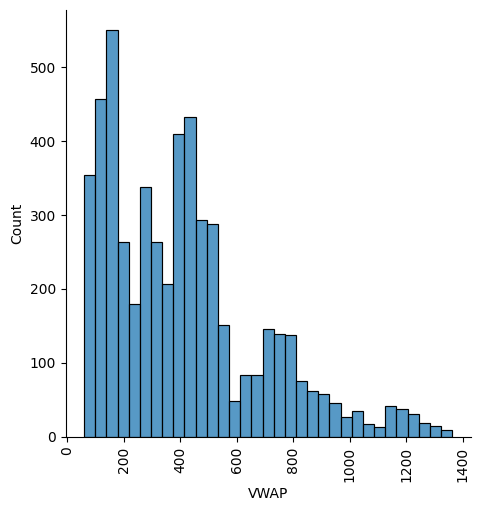

<Figure size 2500x600 with 0 Axes>

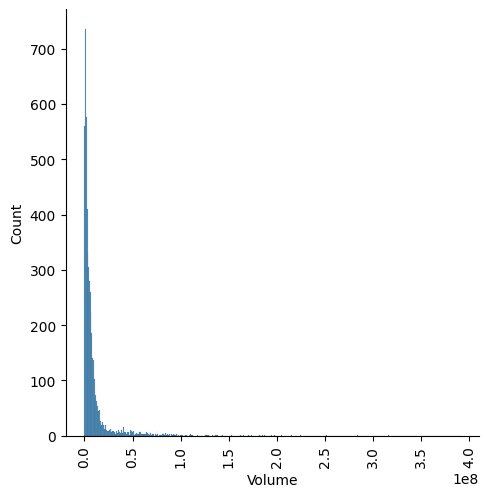

<Figure size 2500x600 with 0 Axes>

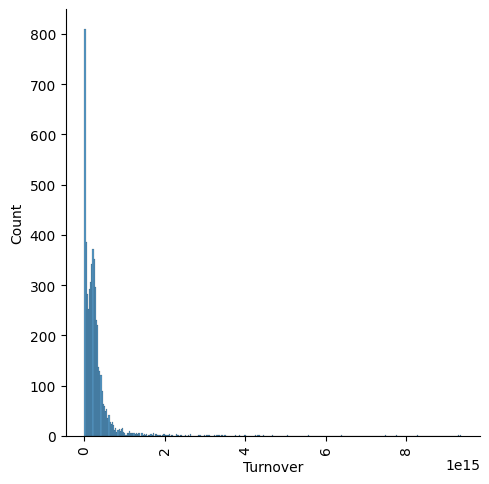

<Figure size 2500x600 with 0 Axes>

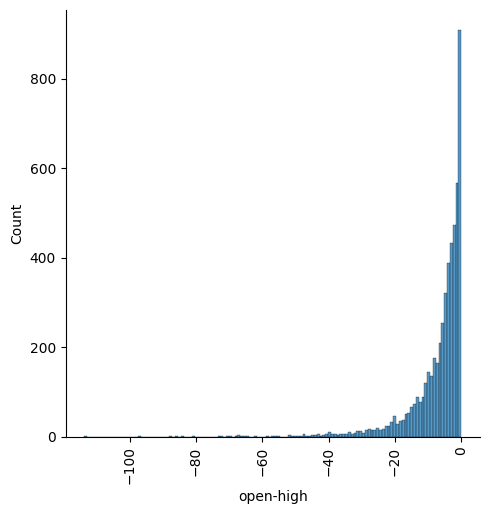

<Figure size 2500x600 with 0 Axes>

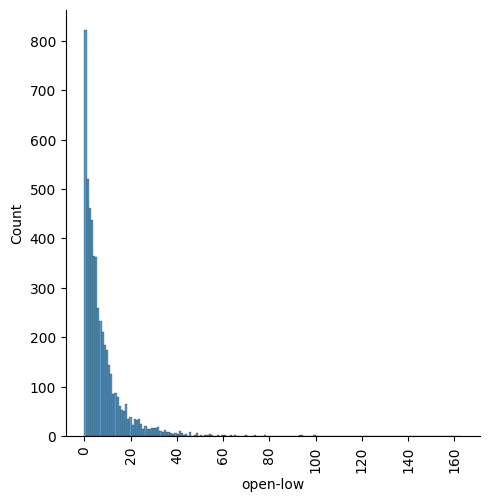

<Figure size 2500x600 with 0 Axes>

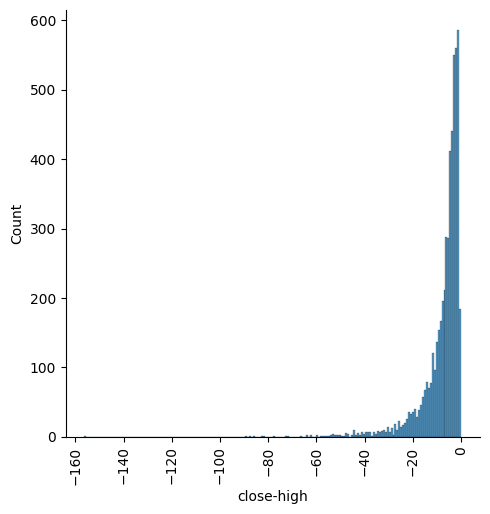

<Figure size 2500x600 with 0 Axes>

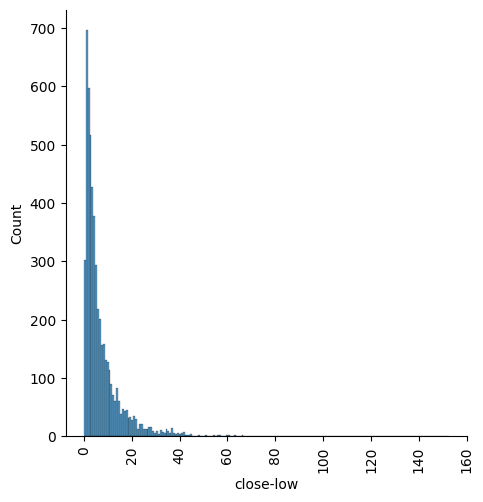

<Figure size 2500x600 with 0 Axes>

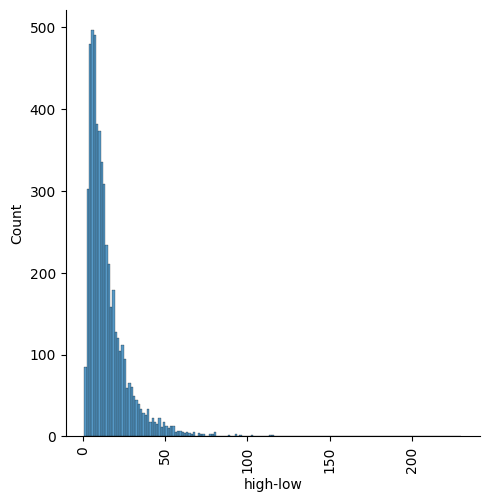

<Figure size 2500x600 with 0 Axes>

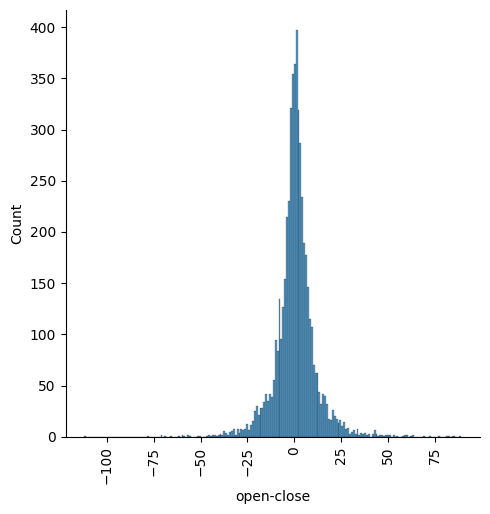

<Figure size 2500x600 with 0 Axes>

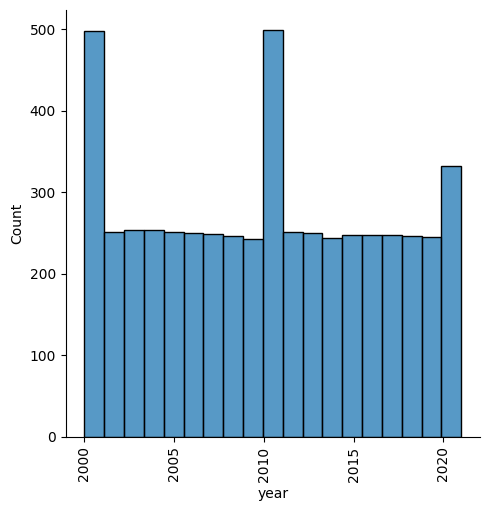

<Figure size 2500x600 with 0 Axes>

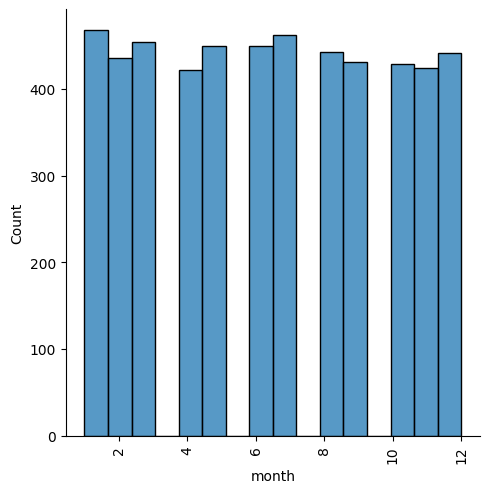

<Figure size 2500x600 with 0 Axes>

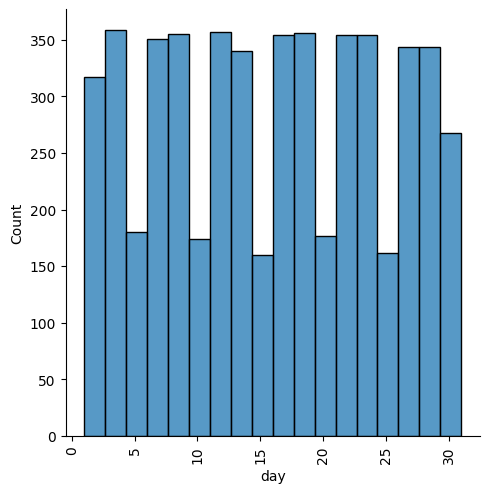

In [19]:
for column in columns:
    plt.figure(figsize = (25,6))
    sns.displot(df[column])
    plt.xticks(rotation=90)
    plt.show()

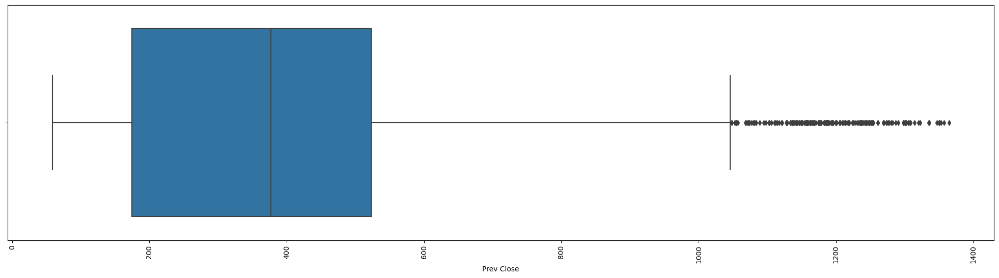

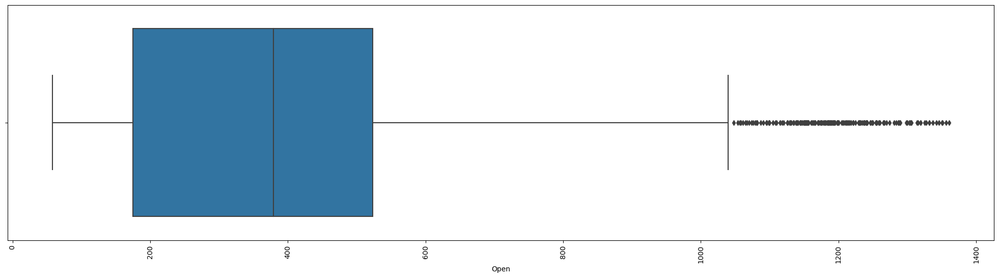

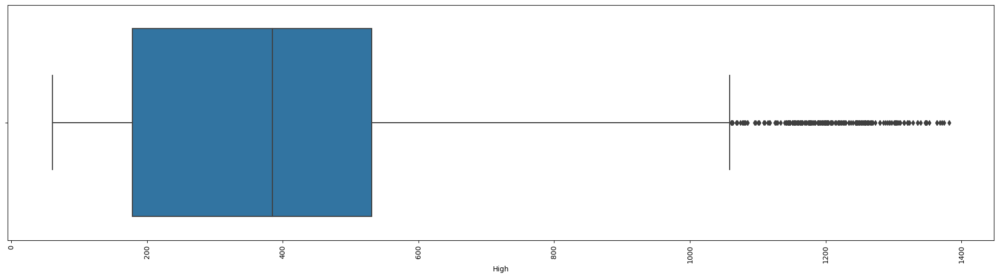

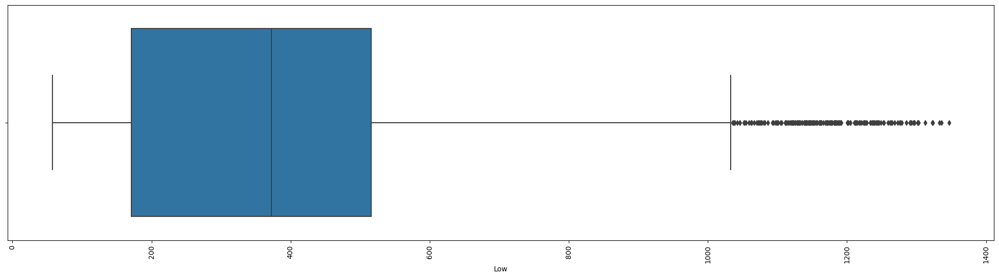

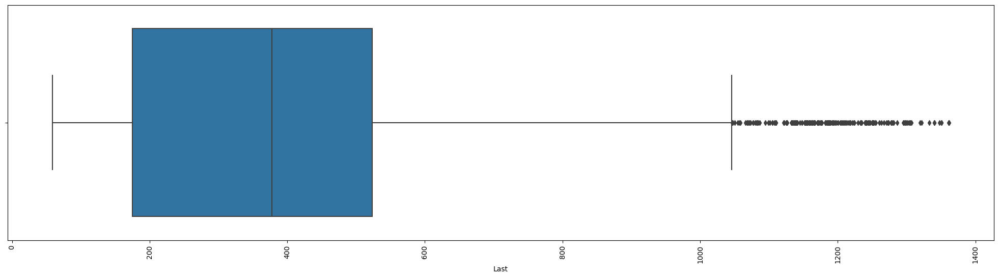

...

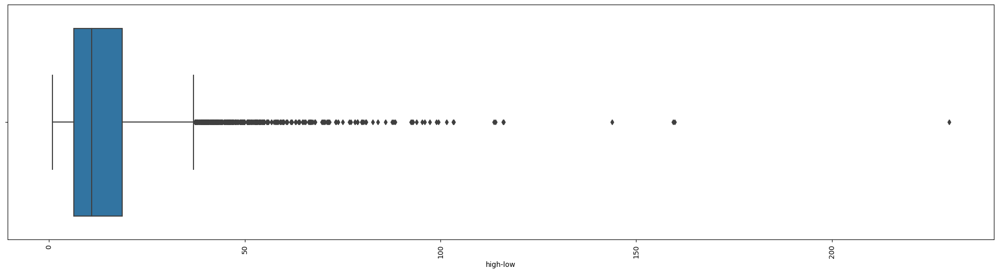

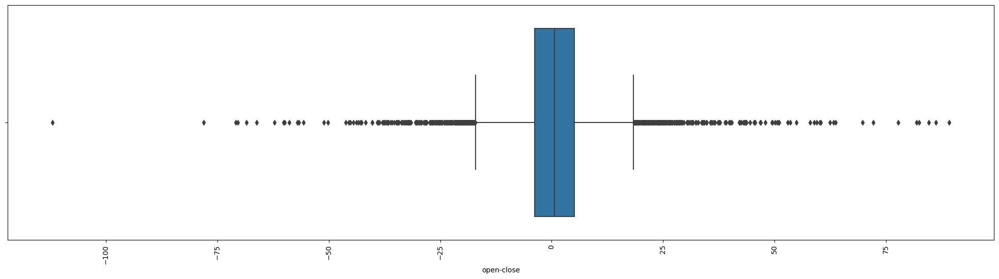

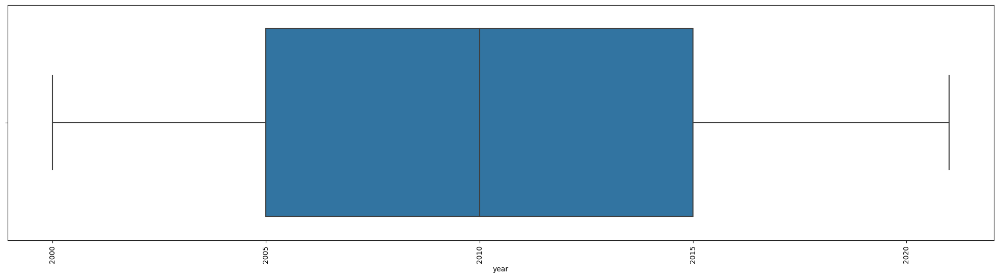

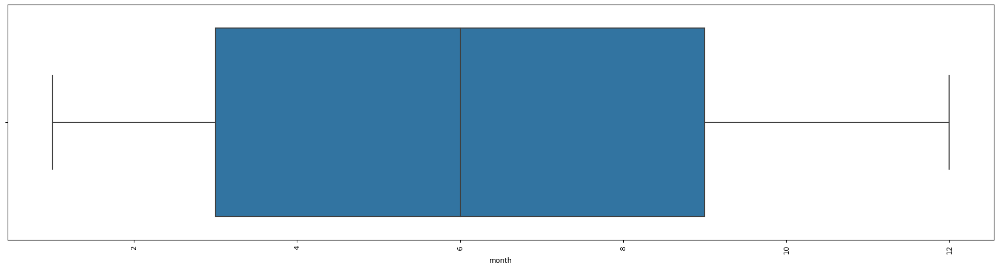

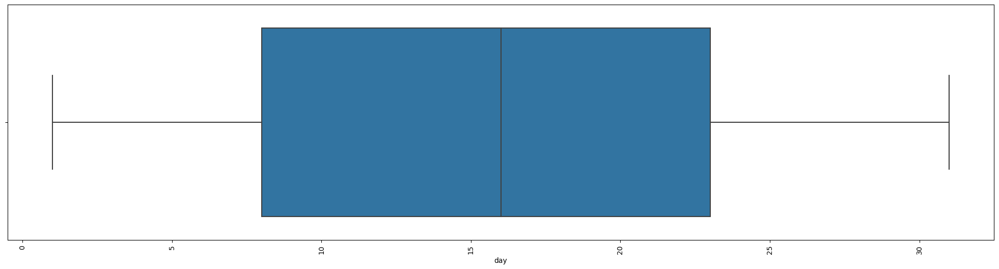

In [20]:
for column in columns:
    plt.figure(figsize = (25,6))
    sns.boxplot(x = df[column])
    plt.xticks(rotation=90)
    plt.show()

In [21]:
sns.pairplot(df[df.columns],height = 5 ,kind ='scatter',diag_kind='kde')

# Building & Evaluating Machine learning Model

In [22]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

In [23]:
X = df.drop('Close', axis=1)
y = df['Close']

In [24]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [25]:
model = LinearRegression()

In [26]:
# Train the Linear Regression Model
model.fit(X_train, y_train)

LinearRegression()

# Predictions

In [27]:
preds = model.predict(X_test)

In [28]:
from sklearn.metrics import r2_score

# Evaluate the model's accuracy
accuracy = r2_score(y_test, preds)
print("Accuracy:", accuracy)

Accuracy: 1.0
